# Analysis of microscopy images

author: ericmuckley@gmail.com

## Install and import libraries

First install ***ncem***, a package for electron microscopy analysis
supported by the National Center for Electron Microscopy at the
Molecular Foundry. Code is avilable here:
https://github.com/ercius/openNCEM

In [1]:
!pip install ncempy

import numpy as np
from glob import glob
from time import time
from ncempy.io import dm
import scipy.fftpack as fp
import matplotlib.pyplot as plt

## Import all the images from Github

In [2]:
# clone the entire github repository where the data file is located
%cd /content/
!rm -rf cloned-data
!git clone -l -s git://github.com/ericmuckley/datasets.git cloned-data
# navigate to the repo
%cd cloned-data/2020-01-24_CeO2ZnO2_on_graphene/

# set path of folder which contains image files
folder_path = "/content/cloned-data/2020-01-24_CeO2ZnO2_on_graphene/*.*"
files = glob(folder_path)
print('\n-----------------------------\nFound {} files:'.format(len(files)))
for f in files:
    print(f.split('/')[-1])

/content
Cloning into 'cloned-data'...
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 214 (delta 1), reused 4 (delta 1), pack-reused 209
Receiving objects: 100% (214/214), 233.83 MiB | 31.39 MiB/s, done.
Resolving deltas: 100% (80/80), done.
Checking out files: 100% (52/52), done.
/content/cloned-data/2020-01-24_CeO2ZnO2_on_graphene

-----------------------------
Found 38 files:
2-13-110ms.dm3
3-CW-17%10s.dm3
1-400K_as_dep-c.dm3
3-CW-16%10s.dm3
1-CW_10%_1s.dm3
3-CW-17.5%260s.dm3
1-SAED_as_dep-b.dm3
3-CW-17.5%140s.dm3
3-CW-18%5s.dm3
3-pristie.dm3
2-CW18%.dm3
1-CW_10%_1s-b.dm3
3-CW15%.dm3
3-SI_Survey_Image.dm3
3-SAED_after_18%.dm3
3-spot_HAADF.dm3
3-CW-17.5%20s.dm3
1-400K_as_dep-b.dm3
3-CW-17.5%10s.dm3
2-pristine.dm3
3-spot_EELS.dm3
3-CW-18%10s.dm3
3-EELS_Spectrum_Image.dm3
2-CW19%-2.dm3
1-CW_10%_1s-SAED.dm3
3-CW-16.5%10s.dm3
3-CW-17.5%80s.dm3
1-SAED_as_dep.dm3
3-scanning_EELS_Acquire.dm3
3-An

## Define some functions

In [0]:
# change matplotlib settings to make plots look nicer
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.minor.width'] = 3
plt.rcParams['xtick.major.width'] = 3
plt.rcParams['ytick.minor.width'] = 3
plt.rcParams['ytick.major.width'] = 3


def plot_setup(labels=['X', 'Y'], fsize=18, setlimits=False,
               limits=[0,1,0,1], title='',
               legend=False, save=False, filename='plot.jpg'):
    """Creates a custom plot configuration to make graphs look nice.
    This can be called with matplotlib for setting axes labels,
    titles, axes ranges, and the font size of plot labels.
    This should be called between plt.plot() and plt.show() commands."""
    plt.xlabel(str(labels[0]), fontsize=fsize)
    plt.ylabel(str(labels[1]), fontsize=fsize)
    plt.title(title, fontsize=fsize)
    fig = plt.gcf()
    fig.set_size_inches(5, 5)
    if legend:
        plt.legend(fontsize=fsize-4)
    if setlimits:
        plt.xlim((limits[0], limits[1]))
        plt.ylim((limits[2], limits[3]))
    if save:
        fig.savefig(filename, dpi=120, bbox_inches='tight')
        plt.tight_layout()


def get_physical_image_size(data):
    """Get the physcial size of the image, using the dictionary of image
    data as an input."""
    nm_per_x_pixel, nm_per_y_pixel = data['pixelSize']
    x_span = nm_per_x_pixel*len(data['data'][0])
    y_span = nm_per_y_pixel*len(data['data'])
    return [0, x_span, 0, y_span], nm_per_x_pixel


def scale_array(arr, lim=(0, 1)):
    """Scale values of an array inside new limits."""
    scale = lim[1] - lim[0]
    arr_scaled = scale*(arr-np.min(arr))/(np.max(arr)-np.min(arr))+lim[0]
    return arr_scaled


def array_phase(x, y):
    """Get average phase angle from arrays of x and y values."""
    x, y = np.median(np.abs(x)), np.median(np.abs(y))
    phase = np.abs(np.arctan(np.divide(y, x)))
    return phase


def array_mag(x, y):
    """Get magnitudes from arrays of x and y values."""
    mag = np.sqrt(np.median(np.square(x)) + np.median(np.square(y)))
    return mag


def std_lims(arr, n=1):
    """Create limits for a plot scale based on n number of standard
    deviations the scale should stretch beyond the mean of an array."""
    avg = np.mean(arr)
    std = np.std(arr)
    return (avg-n*std, avg+n*std)


def get_window_grid(data, window_len):
    """Get a grid of pixel coordinates at which to position a sliding
    window across the entire image."""
    x_steps = np.arange(0, len(data['data'][0])-window_len, window_len)
    y_steps = np.arange(0, len(data['data'])-window_len, window_len)
    grid = np.array(np.meshgrid(x_steps, y_steps)).T.reshape(-1,2)
    return grid


def image_filter(img, show_plots=False):
    """Filter out high and low freuqnecies from an image using 2D FFT.""" 
    # calculate the 2D FFT
    fft = fp.fftshift(fp.fft2((img).astype(float)))
    if show_plots:
        # plot the raw image
        plt.imshow(img, origin='lower', cmap='gray')
        plot_setup(title=image_label+' raw image',
                labels=['Distance (nm)', 'Distance (nm)'])
        plt.show()
        # plot the 2D FFt
        plt.imshow((20*np.log10( 0.1 + fft)).astype(int),
                   origin='lower', cmap='gray')
        plot_setup(title='FFT', labels=['Distance (nm)', 'Distance (nm)'])
        plt.show()
    # get image shape
    (w, h) = np.shape(img)
    h_lim, w_lim = int(h/6), int(w/6)
    # filter out high and low frequencies
    n = int(w/100)
    fft[int(w/2)-n:int(w/2)+n, int(h/2)-n:int(h/2)+n] = 0
    fft[:h_lim] = 0
    fft[-h_lim:] = 0
    fft[:, :w_lim] = 0
    fft[:, -w_lim:] = 0
    # get filtered image
    img2 = np.real(fp.ifft2(fp.ifftshift(fft)))
    if show_plots:
        # plot filtered FFT
        plt.imshow((20*np.log10( 0.1 + fft)).astype(int),
            origin='lower', cmap='gray', extent=img_span)
        plot_setup(title='FFT', labels=['Distance (nm)', 'Distance (nm)'])
        plt.show()
        # plot fixltered image
        plt.imshow(img2, origin='lower', cmap='gray', extent=img_span)
        plot_setup()
        plt.show()
    return img2


def map_domains(data, win_len):
    """Map the domains using data and window length of the sliding window.
    The sliding window is rastered over the image and gradient statistics
    are collected over each window of pixels, which enables compilation of
    the statistics into a map to be overlaid on the original image."""
    # intialize empty maps to hold domain orientation information
    remap, keys = {}, ['gradient_angle', 'gradient_magnitude',
                       'fft_peak_dist', 'fft_peak_angle']
    remap.update({k: np.zeros_like(data['data']).astype(float) for k in keys})

    # get grid of sliding window locations
    grid = get_window_grid(data, win_len)

    # loop sliding window over entire image
    for x0, y0 in grid:
        # get window area
        x1, y1 = (x0+win_len, y0+win_len)

        # check if FFT-filtered image data exists. If not, use raw image
        if 'filtered' in list(data.keys()):
            img0 = data['filtered'][y0:y1, x0:x1]
        else:
            img0 = data['data'][y0:y1, x0:x1]
        img = scale_array(img0)
        
        # perform 2D FFT
        fft_complex = fp.fftshift(fp.fft2((img0).astype(float)))
        fft_re = np.abs(np.real(fft_complex))
        fft_im = np.abs(np.imag(fft_complex))
        fft_re[int(win_len/2), int(win_len/2)] = 0

        indices = np.argpartition(fft_re.flatten(), -1)[-1:]
        peak_idx = np.vstack(np.unravel_index(indices, fft_re.shape)).T[0] 
        peak_loc = np.subtract(int(win_len/2), [peak_idx[1], peak_idx[0]])

        fft_peak_dist = np.linalg.norm(peak_loc)
        fft_peak_angle = np.arctan(peak_loc[1]/peak_loc[0])

        #remap['fft'][y0:y1, x0:x1] = fft_re
        remap['fft_peak_dist'][y0:y1, x0:x1] = fft_peak_dist
        remap['fft_peak_angle'][y0:y1, x0:x1] = fft_peak_angle

        # get 2D gradient statistics of window area
        grad_y, grad_x = np.abs(np.gradient(img0))
        remap['gradient_angle'][y0:y1, x0:x1] = array_phase(grad_x, grad_y)
        remap['gradient_magnitude'][y0:y1, x0:x1] = array_mag(grad_x, grad_y)

    # scale final result maps
    for r in remap:
        std_lim = std_lims(remap[r])
        # mask out values without strong signals
        #remap[r] = np.where(np.logical_and(remap[r]>std_lim[0],
        #                                   remap[r]<std_lim[1]),
        #                    np.nan, remap[r])
        
        #remap[r] = scale_array(remap[r])
    return remap

## Loop over each image and perform analysis


------------------------------
File: 3-CW-17%10s


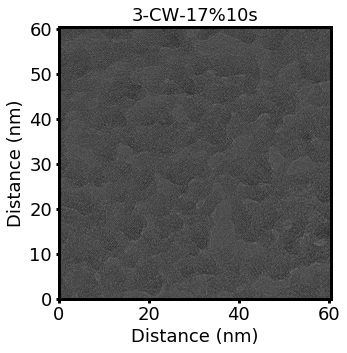

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:154: RuntimeWarning: divide by zero encountered in long_scalars


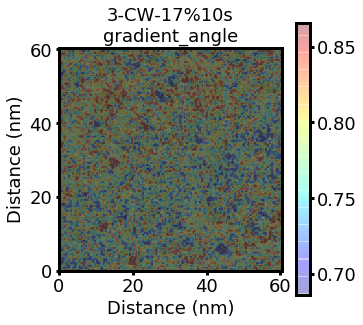

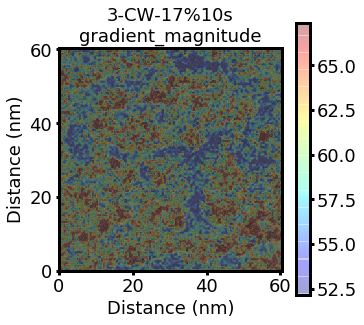

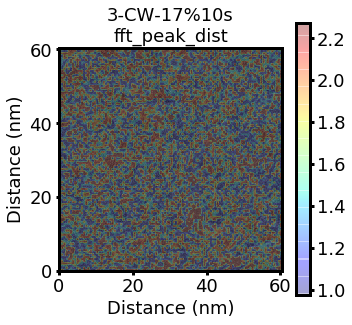

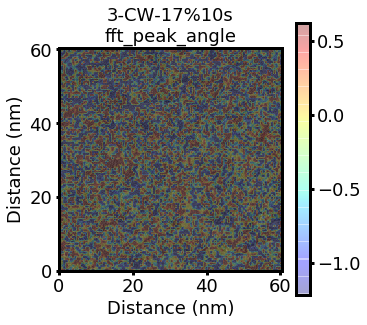

image runtime: 11 s
total runtime: 11 s

------------------------------
File: 3-CW-16%10s


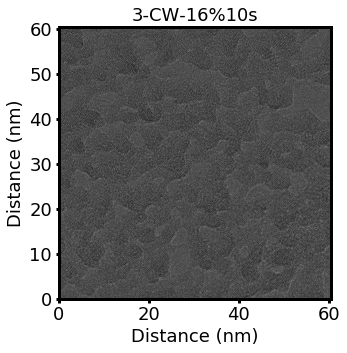

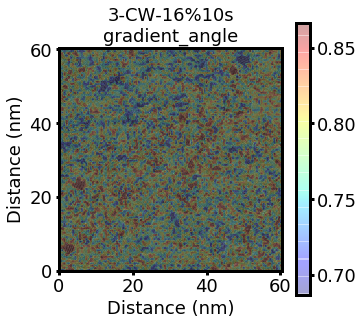

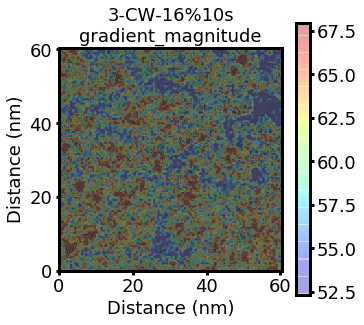

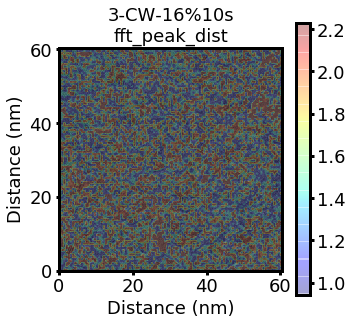

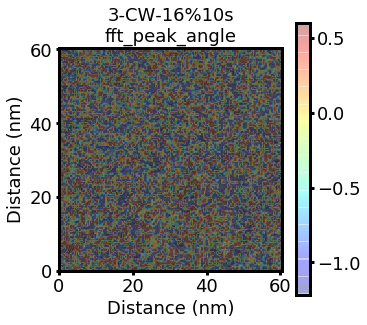

image runtime: 11 s
total runtime: 22 s

------------------------------
File: 1-CW_10%_1s


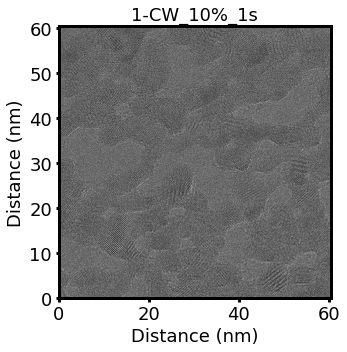

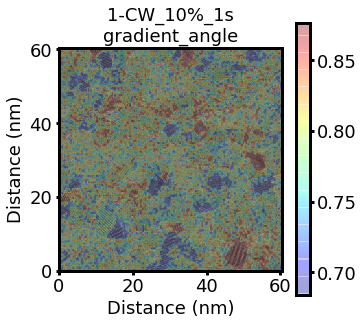

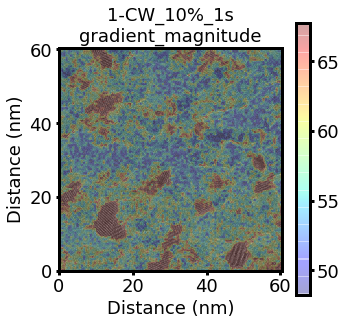

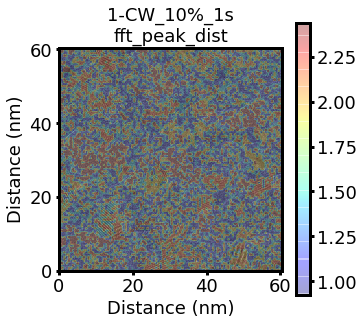

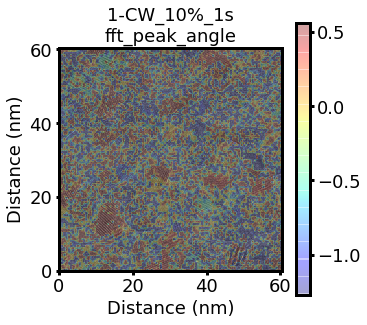

image runtime: 11 s
total runtime: 32 s

------------------------------
File: 3-CW-17.5%260s


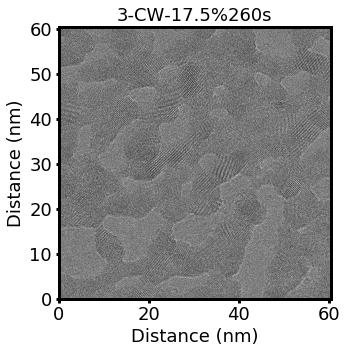

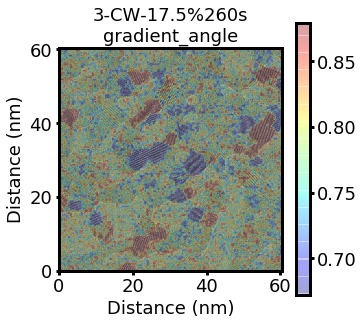

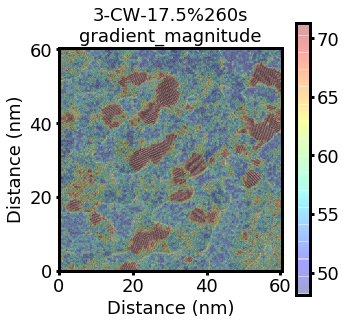

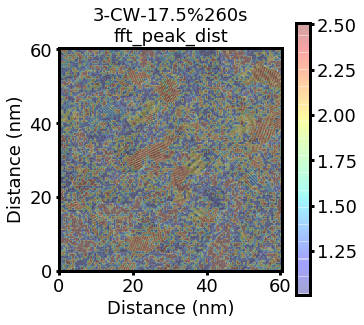

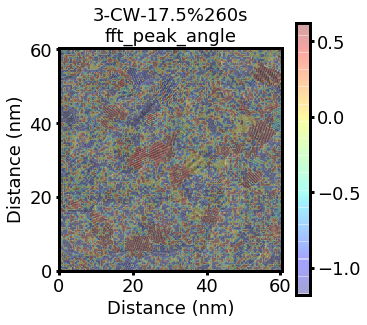

image runtime: 11 s
total runtime: 43 s

------------------------------
File: 3-CW-17.5%140s


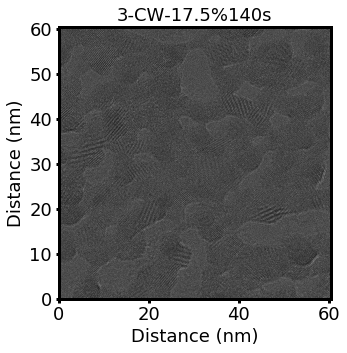

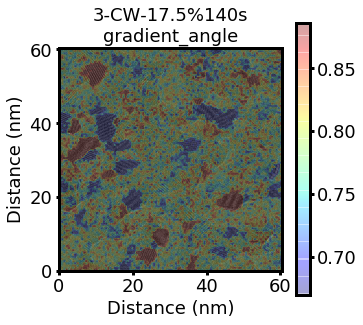

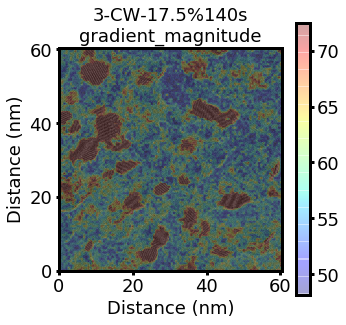

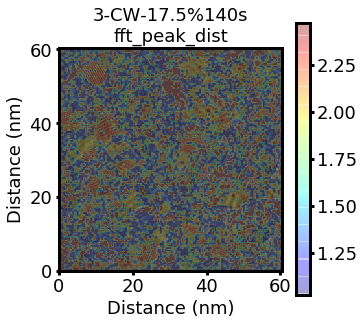

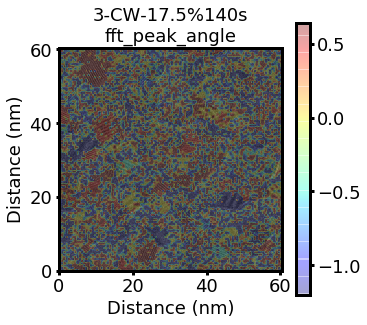

image runtime: 11 s
total runtime: 54 s

------------------------------
File: 3-CW-18%5s


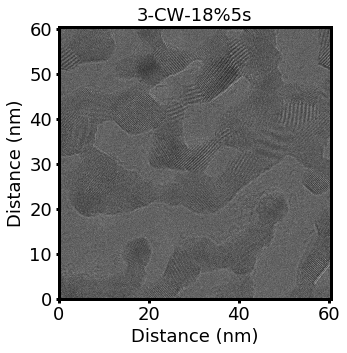

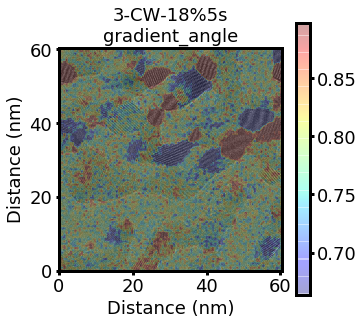

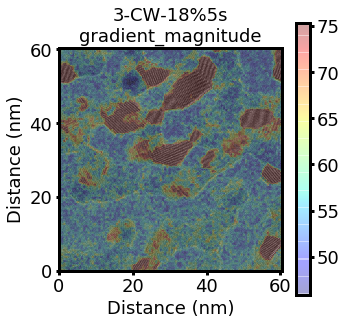

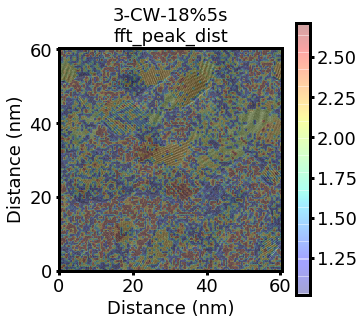

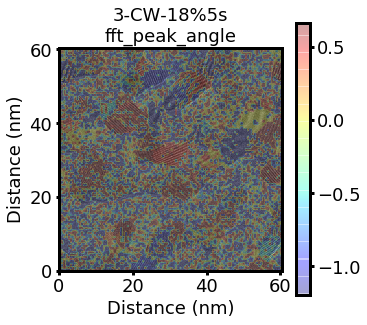

image runtime: 11 s
total runtime: 65 s

------------------------------
File: 2-CW18%


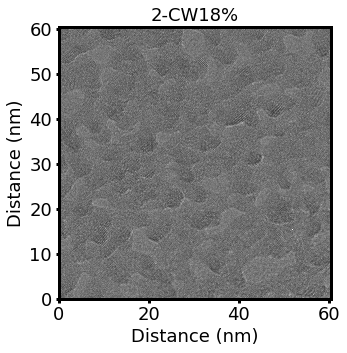

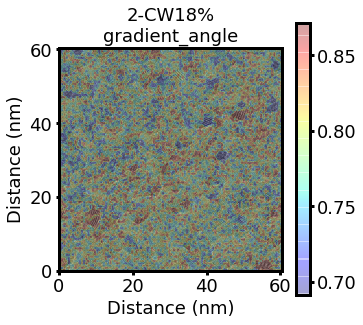

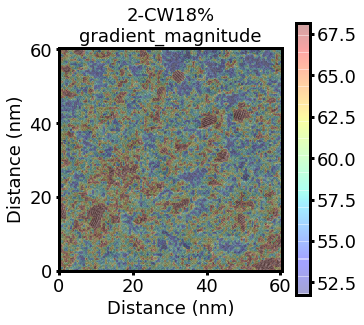

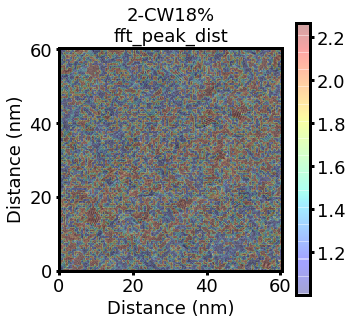

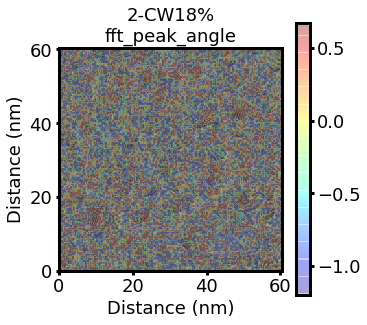

image runtime: 11 s
total runtime: 76 s

------------------------------
File: 1-CW_10%_1s-b


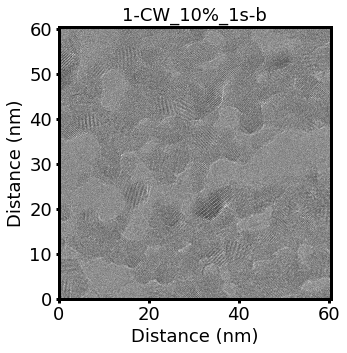

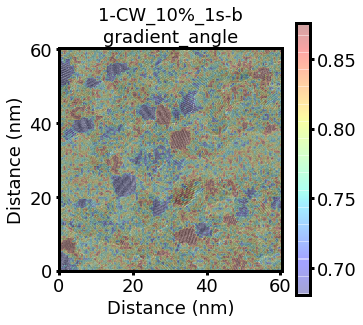

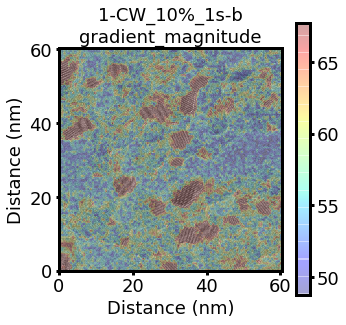

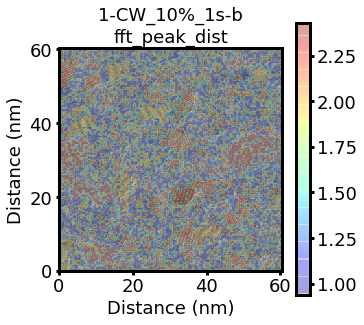

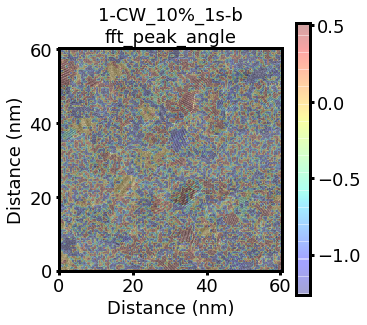

image runtime: 11 s
total runtime: 87 s

------------------------------
File: 3-CW15%


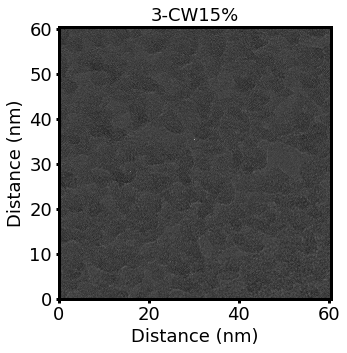

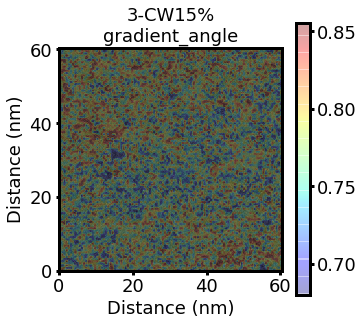

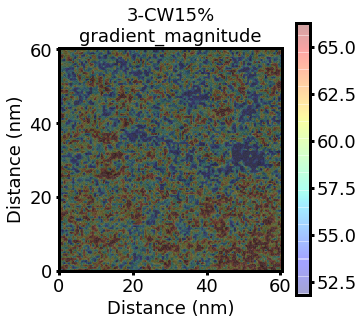

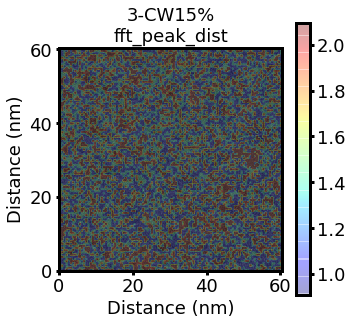

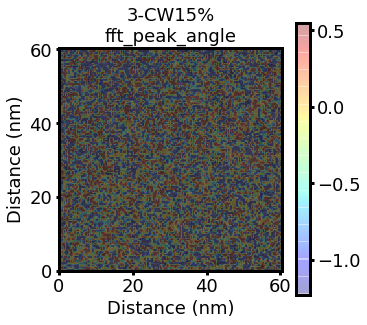

image runtime: 11 s
total runtime: 98 s

------------------------------
File: 3-CW-17.5%20s


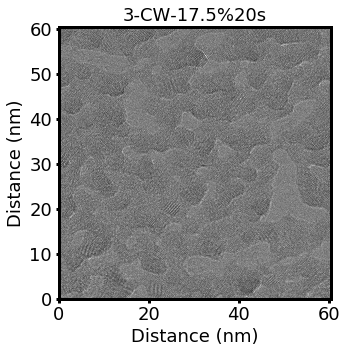

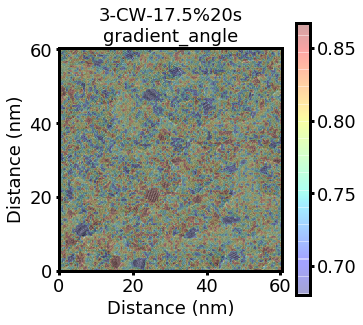

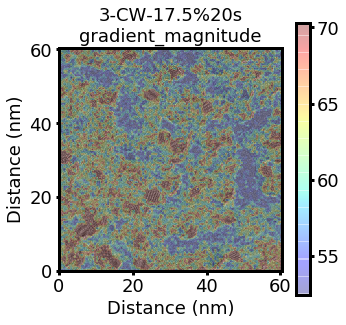

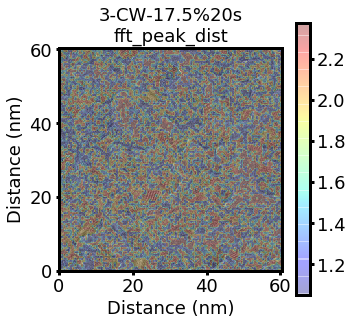

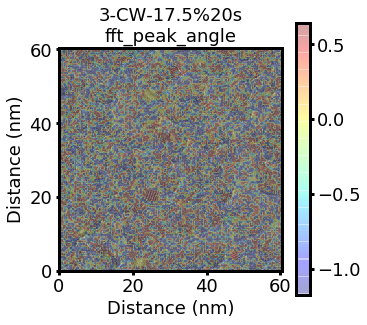

image runtime: 11 s
total runtime: 108 s

------------------------------
File: 3-CW-17.5%10s


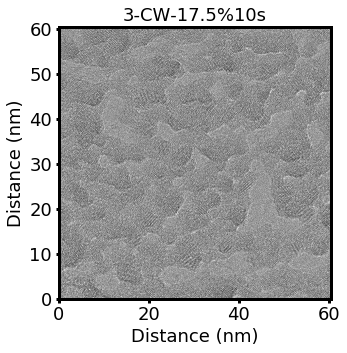

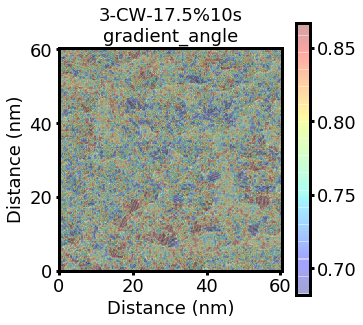

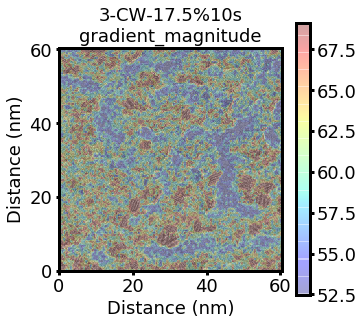

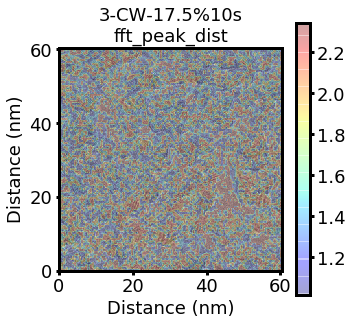

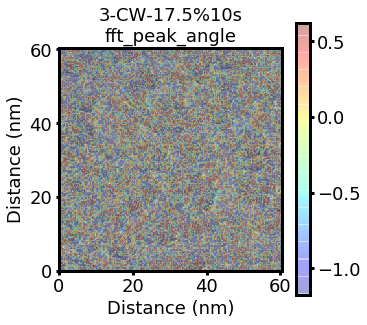

image runtime: 11 s
total runtime: 119 s

------------------------------
File: 3-CW-18%10s


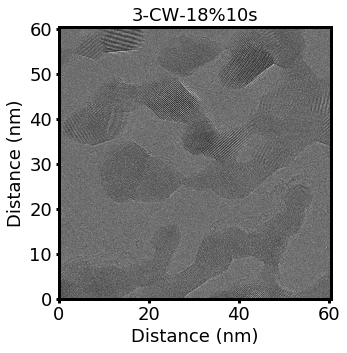

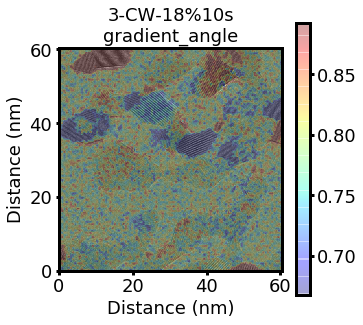

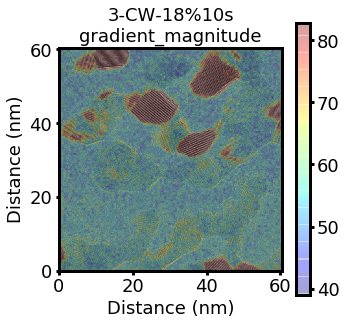

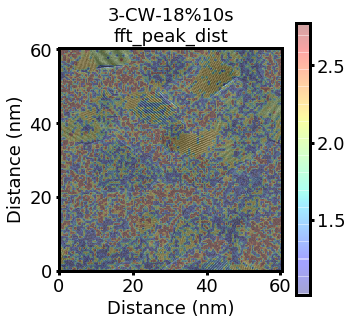

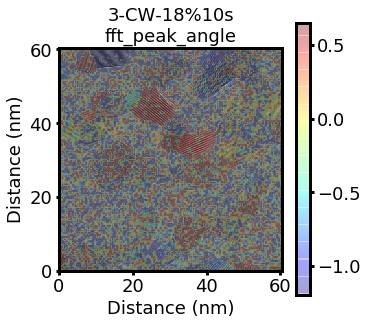

image runtime: 11 s
total runtime: 130 s

------------------------------
File: 2-CW19%-2


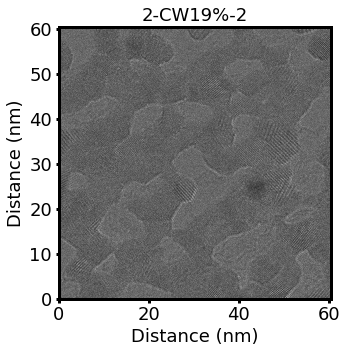

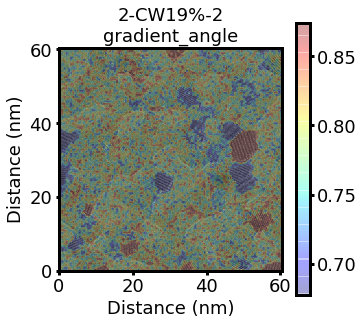

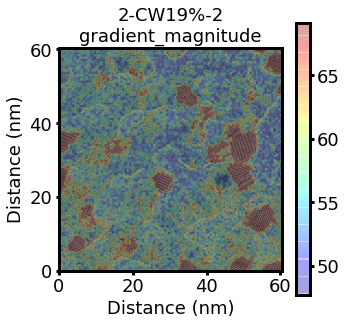

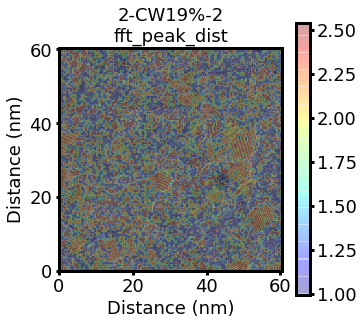

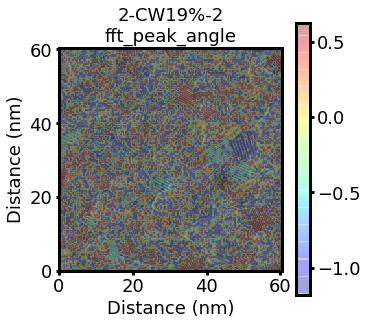

image runtime: 11 s
total runtime: 141 s

------------------------------
File: 3-CW-16.5%10s


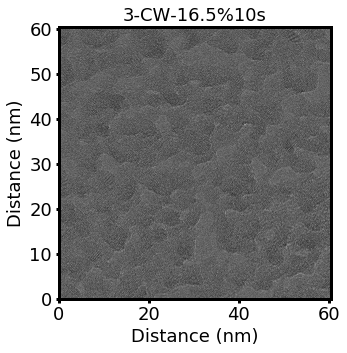

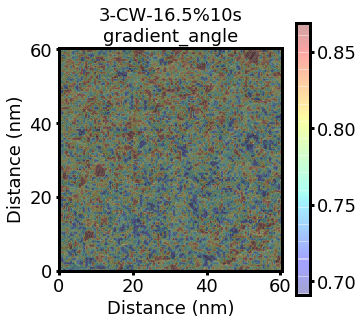

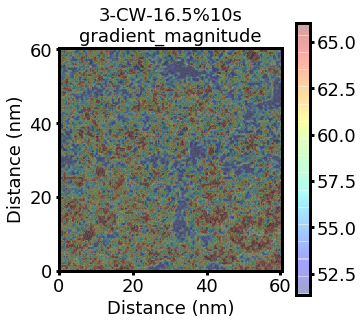

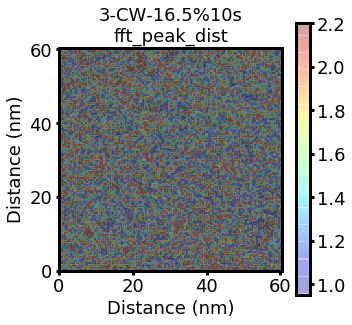

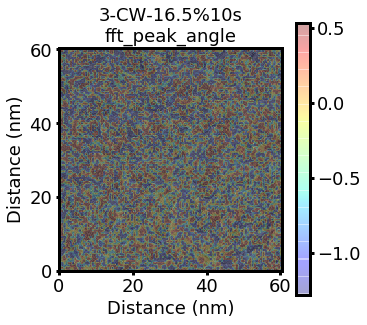

image runtime: 11 s
total runtime: 152 s

------------------------------
File: 3-CW-17.5%80s


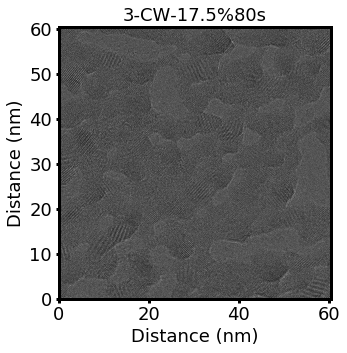

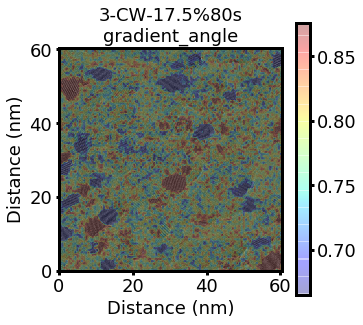

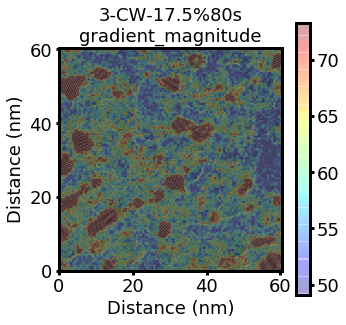

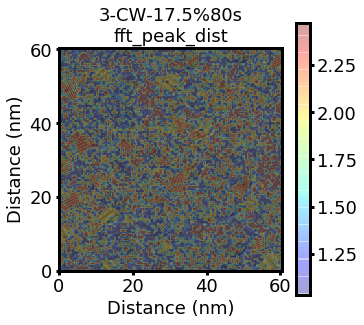

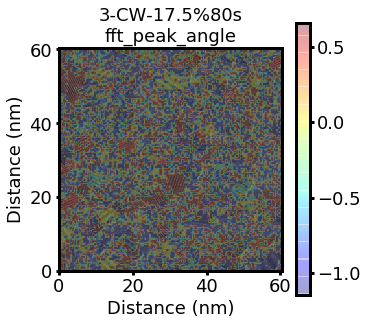

image runtime: 11 s
total runtime: 163 s

------------------------------
File: 3-CW-15%3s


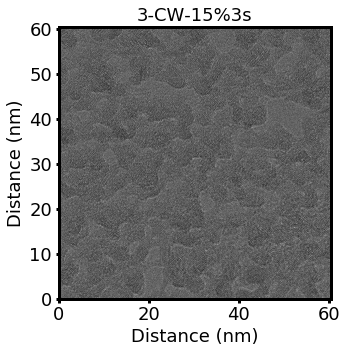

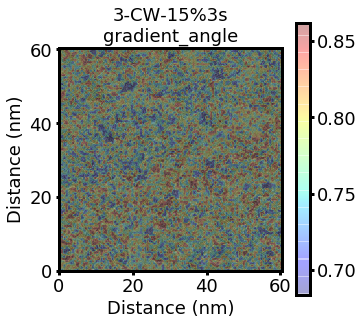

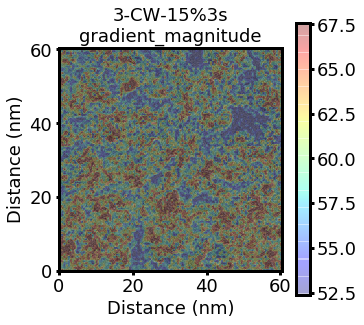

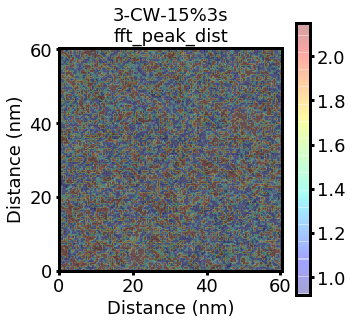

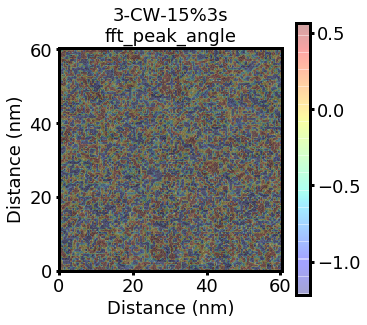

image runtime: 11 s
total runtime: 173 s

------------------------------
File: 2-CW19%


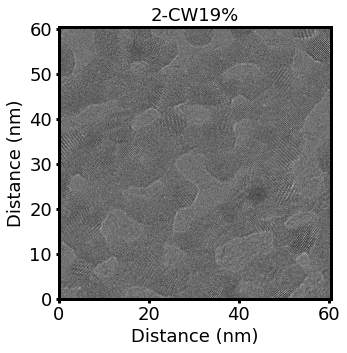

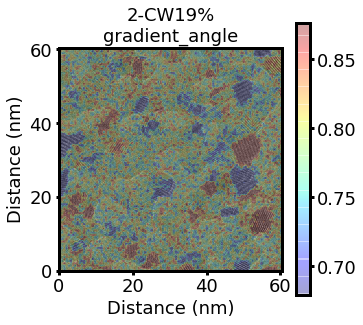

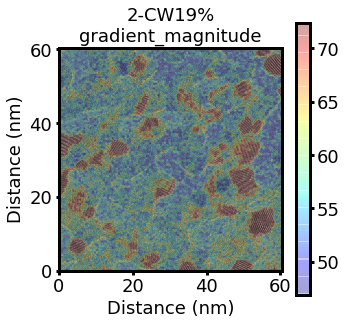

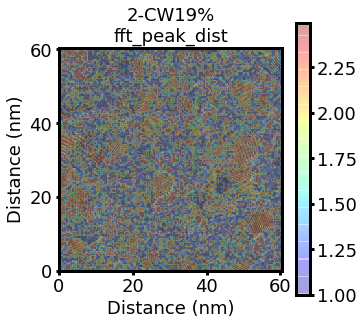

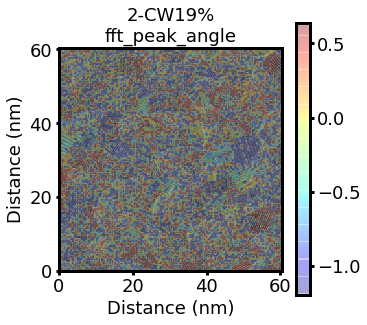

image runtime: 11 s
total runtime: 184 s

------------------------------
File: 2-cw17%


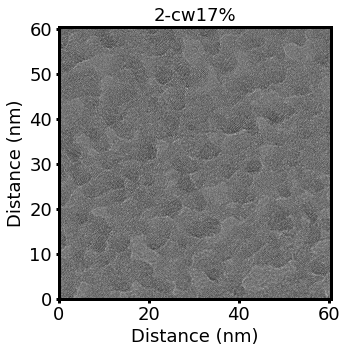

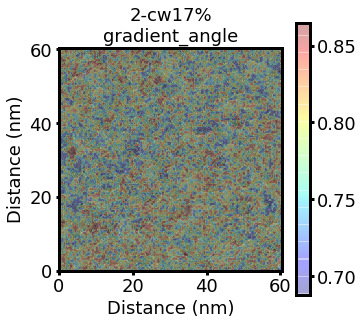

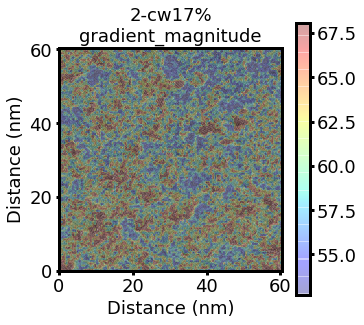

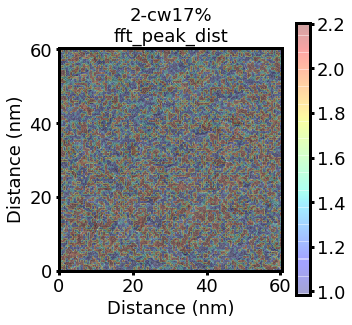

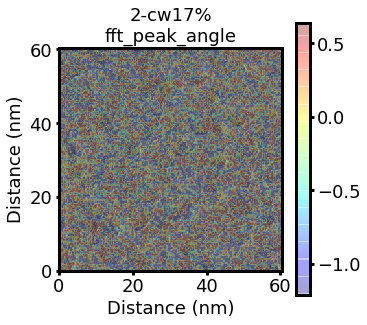

image runtime: 11 s
total runtime: 195 s

------------------------------
File: 1-CW_10%_1s-c


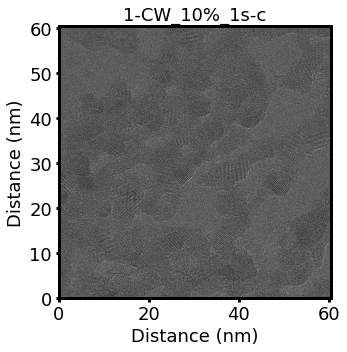

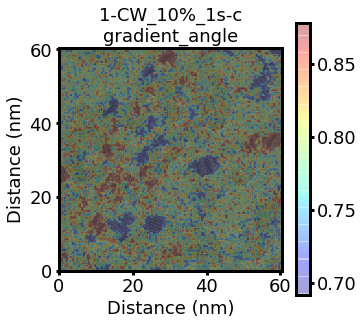

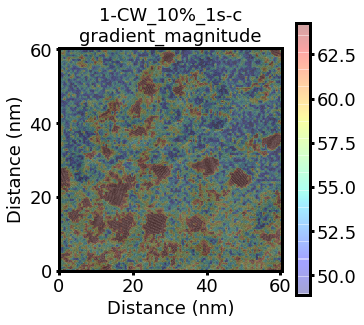

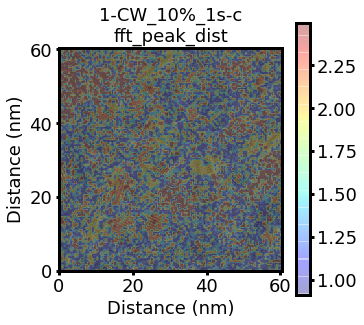

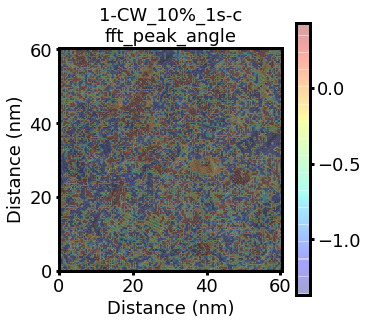

image runtime: 11 s
total runtime: 205 s


In [4]:
# set sliding window length in pixels
win_len = 20

# get list of image files to examine
images = [f for f in files if 'CW' in f.upper() and 'SAED' not in f.upper()]
# loop over each image
script_start_time = time()
for filename in images:#[3:6]:
    # read file
    image_start_time = time()
    data = dm.dmReader(filename)
    image_label = filename.split('/')[-1].split('.dm3')[0]
    print('\n------------------------------\nFile: {}'.format(image_label))
    img_span, nm_per_pixel = get_physical_image_size(data)
    # data['filtered'] = image_filter(data['data'], show_plots=False)
    # plot the raw image
    plt.imshow(data['data'], origin='lower', cmap='gray', extent=img_span)
    plot_setup(title=image_label, labels=['Distance (nm)', 'Distance (nm)'])
    plt.show()

    # plot caculated maps on top of original image
    result_map = map_domains(data, win_len)
    for r in list(result_map.keys()):
        # plot raw image
        plt.imshow(data['data'], origin='lower', zorder=0,
                    cmap='gray', extent=img_span)
        # plot the calculated result
        scale_lim = std_lims(result_map[r])
        plt.imshow(result_map[r], origin='lower', cmap='jet',
                   zorder=2, extent=img_span, alpha=0.2,
                   vmin=scale_lim[0], vmax=scale_lim[1],
                   interpolation='gaussian')
        plot_setup(title=image_label+'\n'+r,
                labels=['Distance (nm)', 'Distance (nm)'])
        plt.colorbar()
        plt.show()

    print('image runtime: {} s'.format(round(time() - image_start_time)))
    print('total runtime: {} s'.format(round(time() - script_start_time)))